In [1]:
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from mpl_toolkits.mplot3d import Axes3D

In [ ]:
# Step 1: Read the data from the Excel file into a pandas DataFrame
data = pd.read_excel('Data Pre.xlsx')

In [ ]:
# Step 1: Read the data from the Excel file into a pandas DataFrame
data = pd.read_excel('Data Pre.xlsx')
# Step2: Add some new related columns
data['Total'] = data['Price'] * data['Quantity']
data['BrowsingIntensity'] = data['BrowsingTime'] / data['Quantity']
data['Frequency'] = data.groupby("CustomerID")["PurchaseDate"].transform("count")
# Step3: info of the data
data.info()
# Step4: Handling null columns
data.isnull().sum()
# Step5: Describe the data
data.describe()

In [71]:
data = data[['Age', 'Price', 'Quantity','Total', 'BrowsingTime','Recency','Frequency','BrowsingIntensity']]

In [72]:
import warnings
warnings.filterwarnings("ignore")

In [73]:
# Step 3: Scale or normalize the remaining features
scaler = StandardScaler()
data_scaled = scaler.fit_transform(data)



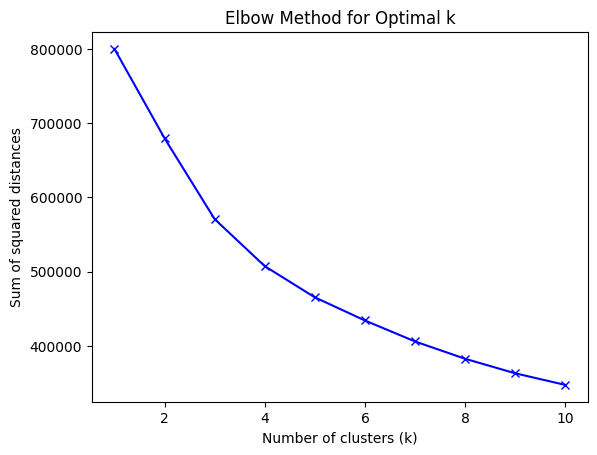

<Figure size 640x480 with 0 Axes>

In [75]:
# Step 3: Scale or normalize the remaining features
scaler = StandardScaler()
data_scaled = scaler.fit_transform(data)
# Step 4: Apply the k-means algorithm to determine optimal clusters
# You can use the elbow method to determine the optimal number of clusters
# For example, by calculating the inertia for different k values
SumOfSquares = []
KRange = range(1, 11)  # Range of k values to try
for k in KRange:
    kmeans = KMeans(n_clusters=k, random_state=0)
    kmeans.fit(data_scaled)
    SumOfSquares.append(kmeans.inertia_)
# Plot the elbow curve
plt.plot(KRange, SumOfSquares, 'bx-')
plt.xlabel('Number of clusters (k)')
plt.ylabel('Sum of squared distances')
plt.title('Elbow Method for Optimal k')
plt.show()
plt.savefig("Elbow.jpg")

In [61]:
from sklearn.metrics import silhouette_score
silhouette_scores = []
for k in range(2, 11):
    kmeans = KMeans(n_clusters=k, random_state=42)
    cluster_labels = kmeans.fit_predict(scaled_data)
    silhouette_scores.append(silhouette_score(scaled_data, cluster_labels))
# Step 5: Assign customers to clusters
# Choose the optimal number of clusters based on the elbow method or other criteria
optimal_k = 11 # Example: optimal number of clusters
kmeans = KMeans(n_clusters=optimal_k, random_state=0)
clusters = kmeans.fit_predict(data_scaled)

# Add cluster labels to the original DataFrame
data['Cluster'] = clusters

In [62]:
import plotly.graph_objects as go

In [63]:
import plotly.graph_objects as go
# Step 4: Apply PCA for visualization
pca = PCA(n_components=3)
data_pca = pca.fit_transform(data_scaled)

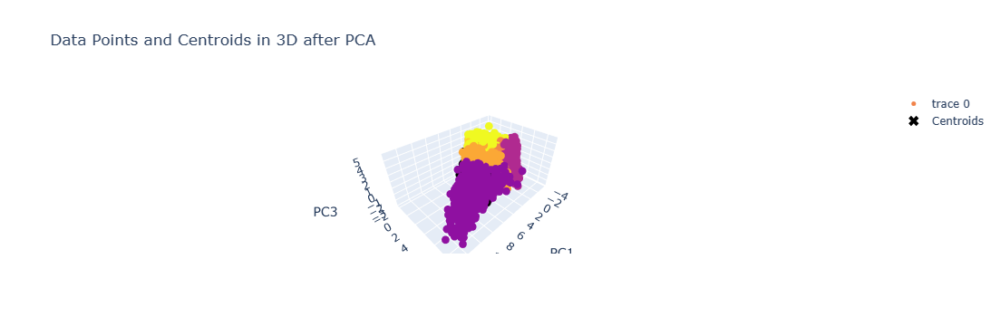

<Figure size 640x480 with 0 Axes>

In [64]:
import plotly.graph_objects as go
# Step 4: Apply PCA for visualization
pca = PCA(n_components=3)
data_pca = pca.fit_transform(data_scaled)
# Add cluster labels to the original DataFrame
data['Cluster'] = clusters
# Step 6: Visualize the data points and centroids in an interactive 3D plot
fig = go.Figure(data=[go.Scatter3d(
    x=data_pca[:, 0],
    y=data_pca[:, 1],
    z=data_pca[:, 2],
    mode='markers',
    marker=dict(color=clusters, size=5),
    text=data.index,
    hoverinfo='text'
)])
centroids = pca.transform(kmeans.cluster_centers_)
fig.add_trace(go.Scatter3d(
    x=centroids[:, 0],
    y=centroids[:, 1],
    z=centroids[:, 2],
    mode='markers',
    marker=dict(color='black', size=10, symbol='x'),
    name='Centroids'
))
fig.update_layout(title='Data Points and Centroids in 3D after PCA',
                  scene=dict(
                      xaxis_title='PC1',
                      yaxis_title='PC2',
                      zaxis_title='PC3'
                  ))
fig.show()
plt.savefig("Data Points and Centroids in 3D PCA.png")

In [65]:
from sklearn.manifold import TSNE

# Step 4: Apply t-SNE for visualization
tsne = TSNE(n_components=3, random_state=0, perplexity=30, early_exaggeration=12, n_iter=500)
data_tsne = tsne.fit_transform(data_scaled)

# Step 5: Apply the k-means algorithm to determine optimal clusters
# Choose the optimal number of clusters based on the elbow method or other criteria
optimal_k = 11  # Example: optimal number of clusters
kmeans = KMeans(n_clusters=optimal_k, random_state=0)
clusters = kmeans.fit_predict(data_scaled)

# Add cluster labels to the original DataFrame
data['Cluster'] = clusters

 # Step 6: Visualize the data points and centroids in an interactive 3D plot
fig = go.Figure(data=[go.Scatter3d(
    x=data_tsne[:, 0],
    y=data_tsne[:, 1],
    z=data_tsne[:, 2],
    mode='markers',
    marker=dict(color=clusters, size=5),
    text=data.index,
    hoverinfo='text'
)])

# centroids = tsne.fit_transform(kmeans.cluster_centers_)
fig.add_trace(go.Scatter3d(
    x=centroids[:, 0],
    y=centroids[:, 1],
    z=centroids[:, 2],
    mode='markers',
    marker=dict(color='red', size=10, symbol='x'),
    name='Centroids'
))
# centroids = tsne.fit_transform(kmeans.cluster_centers_)
fig.add_trace(go.Scatter3d(
    x=centroids[:, 0],
    y=centroids[:, 1],
    z=centroids[:, 2],
    mode='markers',
    marker=dict(color='red', size=10, symbol='x'),
    name='Centroids'
))


In [69]:
data.to_excel("data4.xlsx", index = False)